## Import Libraries

In [201]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library


print('Libraries imported.')

Libraries imported.


## Import GeoJSON files to get neighbourhood data

In [2]:
CLIENT_ID = 'E4FRQ4S0EIXKX02IVTYT10FTCMA4YSZKSRRW2X3FLUSGF30P' # your Foursquare ID
CLIENT_SECRET = 'AMTKUB3TX0BTXN3N5DHMLD4G2LID2EI21YYD4OY3INSNMFJQ' # your Foursquare Secret
ACCESS_TOKEN = 'WWV2G5Z4RXDTMGCCULONPC5MKVVO1GZ3MIVYT3O0WCU410BY' # your FourSquare Access Token
VERSION = '20180605' # Foursquare API version
LIMIT = 300 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: E4FRQ4S0EIXKX02IVTYT10FTCMA4YSZKSRRW2X3FLUSGF30P
CLIENT_SECRET:AMTKUB3TX0BTXN3N5DHMLD4G2LID2EI21YYD4OY3INSNMFJQ


In [3]:
def getNearbyVenues(names, latitudes, longitudes, radius=1500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [4]:
with open('montreal.geojson') as m_json_data:
    montreal_data = json.load(m_json_data)

In [5]:
mon_neighborhoods_data = montreal_data['features']
mon_neighborhoods_data[0]

{'type': 'Feature',
 'properties': {'fclass': 'P',
  'name': 'Ahuntsic-Cartierville',
  'countryCode': 'CA',
  'geonameid': None,
  'created_at': '2013-03-09T07:15:46.703Z',
  'cartodb_id': 6,
  'updated_at': '2013-03-09T07:15:46.986Z',
  'fcode': 'PPLX',
  'lat': 45.57638821173423,
  'parents': '6077243',
  'adminCode4': '',
  'lng': -73.66271205116784,
  'adminCode1': '10',
  'adminCode2': '06',
  'adminCode3': ''},
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[-73.666108, 45.573785],
     [-73.666097, 45.573821],
     [-73.666082, 45.573839],
     [-73.666075, 45.573871],
     [-73.666057, 45.573916],
     [-73.666032, 45.573953],
     [-73.666004, 45.573985],
     [-73.665986, 45.574024],
     [-73.665991, 45.574057],
     [-73.665972, 45.574086],
     [-73.665929, 45.574117],
     [-73.665899, 45.574115],
     [-73.66588, 45.574134],
     [-73.665872, 45.574159],
     [-73.665877, 45.574189],
     [-73.665874, 45.574214],
     [-73.665849, 45.574243],
     [-73.665828

In [6]:
# define the dataframe columns
column_names = ['Neighbourhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
mon_neighborhoods = pd.DataFrame(columns=column_names)

In [7]:
for data in mon_neighborhoods_data: 
    neighborhood_name = data['properties']['name']
    neighborhood_lat = data['properties']['lat']
    neighborhood_lon = data['properties']['lng']
    
    mon_neighborhoods = mon_neighborhoods.append({'Neighbourhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [8]:
mon_neighborhoods

,Neighbourhood,Latitude,Longitude
0,Ahuntsic-Cartierville,45.576388,-73.662712
1,Pierrefonds--Roxboro,45.481054,-73.867003
2,Ahuntsic-Cartierville,45.543146,-73.680433
3,Cote-des-Neiges--Notre-Dame-de-Grace,45.484893,-73.631757
4,Outremont,45.515644,-73.608670
5,Pointe-aux-Trembles-Rivieres-des-Prairies,45.658857,-73.537199
6,Rosemont--La-Petite-Patrie,45.553353,-73.580415
7,Ville-Marie,45.509380,-73.555461
8,Plateau-Mont-Royal,45.526094,-73.580749
9,Anjou,45.612503,-73.565355


In [9]:
with open('vancouver.geojson') as v_json_data:
    vancouver_data = json.load(v_json_data)

In [10]:
van_neighborhoods_data = vancouver_data['features']
van_neighborhoods_data[0]

{'type': 'Feature',
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-123.05658721923828, 49.26198196410718],
    [-123.05662536621094, 49.24317550658764],
    [-123.05811309814453, 49.24182891845287],
    [-123.05819702148436, 49.241752624507555],
    [-123.0582733154297, 49.241672515865],
    [-123.05834197998048, 49.24158859252516],
    [-123.05841064453124, 49.2415046691853],
    [-123.0584716796875, 49.24141693114819],
    [-123.05851745605469, 49.24132537841382],
    [-123.05856323242188, 49.24123764037672],
    [-123.05860137939455, 49.24114227294507],
    [-123.05862426757811, 49.241050720210694],
    [-123.0586471557617, 49.240955352779054],
    [-123.05866241455078, 49.2408599853474],
    [-123.0586700439453, 49.24076461791577],
    [-123.05885314941406, 49.232807159419686],
    [-123.06444549560548, 49.232864379878656],
    [-123.06674194335938, 49.23255538940015],
    [-123.07703399658203, 49.23266601562084],
    [-123.09053802490233, 49.232822418208734],
    [-123.0898

In [11]:
# define the dataframe columns
column_names = ['Neighbourhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
van_neighborhoods = pd.DataFrame(columns=column_names)

for data in van_neighborhoods_data: 
    neighborhood_name = data['properties']['name']
    
    neighborhood_latlon = data['properties']['geo_point_2d']
    neighborhood_lat = neighborhood_latlon[0]
    neighborhood_lon = neighborhood_latlon[1]
    
    van_neighborhoods = van_neighborhoods.append({'Neighbourhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [12]:
van_neighborhoods

,Neighbourhood,Latitude,Longitude
0,Kensington-Cedar Cottage,49.246686,-123.072885
1,Mount Pleasant,49.263065,-123.098513
2,Oakridge,49.226403,-123.123025
3,Renfrew-Collingwood,49.247343,-123.040166
4,Sunset,49.218756,-123.092038
5,West Point Grey,49.268401,-123.203467
6,Dunbar-Southlands,49.237962,-123.189547
7,Kerrisdale,49.223655,-123.159576
8,Killarney,49.217022,-123.037647
9,Kitsilano,49.267540,-123.163295


## Cleaning Montreal Data

In [13]:
#set the url to designated wikipedia page
url = 'https://en.wikipedia.org/wiki/Montreal'

In [14]:
#read the data frames on the webpage into pandas dataframes
dfs = pd.read_html(url)
print(dfs)

[                          Montreal  Montréal (French)  \
0                                                City   
1                                   Ville de Montréal   
2   .mw-parser-output .tmulti .thumbinner{display:...   
3                            FlagCoat of armsWordmark   
4   Nickname(s): "MTL", "The 514", "The City of Fe...   
5   Motto(s): Concordia Salus ("well-being through...   
6                 Location within urban agglomeration   
7   .mw-parser-output .locmap .od{position:absolut...   
8   Coordinates: .mw-parser-output .geo-default,.m...   
9                                             Country   
10                                           Province   
11                                             Region   
12                                                 UA   
13                                            Founded   
14                                       Incorporated   
15                                        Constituted   
16                            

In [15]:
#Select the dataframe containing the postal code data 
df_MON_1 = dfs[3]

# display first 5 rows of data
df_MON_1.head(40)

,N.,Neighbourhoods,Area (Square kilometer),Population (2016) [106],Density inhabitants/ Square kilometer,Average rent ($/month) [107]
0,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0
1,2,Anjou,137,42796,3123.8,1151.0
2,3,Côte-des-Neiges–Notre-Dame-de-Grâce,214,166520,7781.3,1300.0
3,4,Lachine,177,44489,2513.5,1078.0
4,5,LaSalle,163,76853,4714.9,1283.0
5,6,Le Plateau-Mont-Royal,81,104000,12839.5,1437.0
6,7,Le Sud-Ouest,157,78151,4977.8,1526.0
7,8,L'Île-Bizard–Sainte-Geneviève,236,18413,780.2,1639.0
8,9,Mercier–Hochelaga-Maisonneuve,254,136024,5355.3,1164.0
9,10,Montréal-Nord,111,84234,7588.6,1002.0


## Cleaning the dataframe

Replace all unassigned boroughs with NaN and summarize how many NaN values exist

Drop rows including NaN

In [16]:
df_MON_1.dropna(inplace = True)
df_MON_1

,N.,Neighbourhoods,Area (Square kilometer),Population (2016) [106],Density inhabitants/ Square kilometer,Average rent ($/month) [107]
0,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0
1,2,Anjou,137,42796,3123.8,1151.0
2,3,Côte-des-Neiges–Notre-Dame-de-Grâce,214,166520,7781.3,1300.0
3,4,Lachine,177,44489,2513.5,1078.0
4,5,LaSalle,163,76853,4714.9,1283.0
5,6,Le Plateau-Mont-Royal,81,104000,12839.5,1437.0
6,7,Le Sud-Ouest,157,78151,4977.8,1526.0
7,8,L'Île-Bizard–Sainte-Geneviève,236,18413,780.2,1639.0
8,9,Mercier–Hochelaga-Maisonneuve,254,136024,5355.3,1164.0
9,10,Montréal-Nord,111,84234,7588.6,1002.0


Look for any unassigned Neighbourhoods by replacing 'Not assigned with NaN, and then summarizing the NaN data points

Fix index on the dataframe

In [17]:
df_MON_1.reset_index(drop=True)

,N.,Neighbourhoods,Area (Square kilometer),Population (2016) [106],Density inhabitants/ Square kilometer,Average rent ($/month) [107]
0,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0
1,2,Anjou,137,42796,3123.8,1151.0
2,3,Côte-des-Neiges–Notre-Dame-de-Grâce,214,166520,7781.3,1300.0
3,4,Lachine,177,44489,2513.5,1078.0
4,5,LaSalle,163,76853,4714.9,1283.0
5,6,Le Plateau-Mont-Royal,81,104000,12839.5,1437.0
6,7,Le Sud-Ouest,157,78151,4977.8,1526.0
7,8,L'Île-Bizard–Sainte-Geneviève,236,18413,780.2,1639.0
8,9,Mercier–Hochelaga-Maisonneuve,254,136024,5355.3,1164.0
9,10,Montréal-Nord,111,84234,7588.6,1002.0


In [18]:
df_MON_1.rename(columns = {'Population (2016) [106]':'Population (2016)', 'Density inhabitants/ Square kilometer':'Population Density', 'Average rent ($/month) [107]':'Average Monthly Rent'}, inplace = True) 

Find the dimensions of the dataframe

In [19]:
# denominations in the json file
import json
communities_geo = r'montreal.geojson'

# open the json file - json.load() methods returns a python dictionary
with open(communities_geo) as communities_file:
    communities_json = json.load(communities_file)
    
# we loop through the dictionary to obtain the name of the communities in the json file
denominations_json = []
for index in range(len(communities_json['features'])):
    denominations_json.append(communities_json['features'][index]['properties']['name'])
    
denominations_json

['Ahuntsic-Cartierville',
 'Pierrefonds--Roxboro',
 'Ahuntsic-Cartierville',
 'Cote-des-Neiges--Notre-Dame-de-Grace',
 'Outremont',
 'Pointe-aux-Trembles-Rivieres-des-Prairies',
 'Rosemont--La-Petite-Patrie',
 'Ville-Marie',
 'Plateau-Mont-Royal',
 'Anjou',
 'Lachine',
 'Montreal-Nord',
 'LaSalle',
 'Mercier-Hochelaga-Maisonneuve',
 'Saint-Laurent',
 'St-Leonard',
 'Villeray-Saint-Michel-Parc-Extension',
 'Sud-Ouest',
 "L'Ile-Bizard--Sainte-Genevieve",
 'Verdun--Ile-des-Soeurs']

In [20]:
dataframe_names = df_MON_1.Neighbourhoods.tolist()
dataframe_names

['Ahuntsic-Cartierville',
 'Anjou',
 'Côte-des-Neiges–Notre-Dame-de-Grâce',
 'Lachine',
 'LaSalle',
 'Le Plateau-Mont-Royal',
 'Le Sud-Ouest',
 "L'Île-Bizard–Sainte-Geneviève",
 'Mercier–Hochelaga-Maisonneuve',
 'Montréal-Nord',
 'Outremont',
 'Pierrefonds-Roxboro',
 'Rivière-des-Prairies–Pointe-aux-Trembles',
 'Rosemont–La Petite-Patrie',
 'Saint-Laurent',
 'Saint-Léonard',
 'Verdun',
 'Ville-Marie',
 'Villeray–Saint-Michel–Parc-Extension']

In [21]:


# names in the json file - the same order as in the data frame 
geojson_names = ['Ahuntsic-Cartierville','Anjou','Cote-des-Neiges--Notre-Dame-de-Grace','Lachine','LaSalle','Plateau-Mont-Royal','Sud-Ouest',"L'Ile-Bizard--Sainte-Genevieve",'Mercier-Hochelaga-Maisonneuve','Montreal-Nord','Outremont', 'Pierrefonds--Roxboro','Pointe-aux-Trembles-Rivieres-des-Prairies','Rosemont--La-Petite-Patrie','Saint-Laurent', 'St-Leonard','Verdun--Ile-des-Soeurs','Ville-Marie','Villeray-Saint-Michel-Parc-Extension']


# replace data frame names by json names
df_MON_1.replace(dict(zip(dataframe_names, geojson_names)), inplace=True)
df_MON_1

,N.,Neighbourhoods,Area (Square kilometer),Population (2016),Population Density,Average Monthly Rent
0,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0
1,2,Anjou,137,42796,3123.8,1151.0
2,3,Cote-des-Neiges--Notre-Dame-de-Grace,214,166520,7781.3,1300.0
3,4,Lachine,177,44489,2513.5,1078.0
4,5,LaSalle,163,76853,4714.9,1283.0
5,6,Plateau-Mont-Royal,81,104000,12839.5,1437.0
6,7,Sud-Ouest,157,78151,4977.8,1526.0
7,8,L'Ile-Bizard--Sainte-Genevieve,236,18413,780.2,1639.0
8,9,Mercier-Hochelaga-Maisonneuve,254,136024,5355.3,1164.0
9,10,Montreal-Nord,111,84234,7588.6,1002.0


In [22]:
df_Montreal = pd.merge(left=df_MON_1,right=mon_neighborhoods, left_on='Neighbourhoods', right_on='Neighbourhood')
df_Montreal = df_Montreal[1:]
df_Montreal

,N.,Neighbourhoods,Area (Square kilometer),Population (2016),Population Density,Average Monthly Rent,Neighbourhood,Latitude,Longitude
1,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0,Ahuntsic-Cartierville,45.543146,-73.680433
2,2,Anjou,137,42796,3123.8,1151.0,Anjou,45.612503,-73.565355
3,3,Cote-des-Neiges--Notre-Dame-de-Grace,214,166520,7781.3,1300.0,Cote-des-Neiges--Notre-Dame-de-Grace,45.484893,-73.631757
4,4,Lachine,177,44489,2513.5,1078.0,Lachine,45.444809,-73.689583
5,5,LaSalle,163,76853,4714.9,1283.0,LaSalle,45.428989,-73.613800
6,6,Plateau-Mont-Royal,81,104000,12839.5,1437.0,Plateau-Mont-Royal,45.526094,-73.580749
7,7,Sud-Ouest,157,78151,4977.8,1526.0,Sud-Ouest,45.470778,-73.577176
8,8,L'Ile-Bizard--Sainte-Genevieve,236,18413,780.2,1639.0,L'Ile-Bizard--Sainte-Genevieve,45.493960,-73.903146
9,9,Mercier-Hochelaga-Maisonneuve,254,136024,5355.3,1164.0,Mercier-Hochelaga-Maisonneuve,45.575953,-73.534009
10,10,Montreal-Nord,111,84234,7588.6,1002.0,Montreal-Nord,45.603721,-73.630289


## Cleaning up Vancouver dataset

In [23]:
#read the data frames on the webpage into pandas dataframes
df_VAN_1 = pd.read_csv('Vancouver Neighbourhoods.csv')
df_VAN_1

,Neighbourhood,Area (Hectares),Population,Average Monthly Rent
0,Arbutus Ridge,370,15910,1688
1,Downtown Vancouver,370,62030,1589
2,Dunbar-Southlands,856,21425,1824
3,Fairview,327,33620,1341
4,Grandview-Woodland,445,29175,1041
5,Hastings-Sunrise,793,34575,1103
6,Kensington-Cedar Cottage,724,49325,1163
7,Kerrisdale,631,13975,1504
8,Killarney,664,29325,1094
9,Kitsilano,546,43045,1472


In [24]:
# denominations in the json file
import json
communities_geo = r'vancouver.geojson'

# open the json file - json.load() methods returns a python dictionary
with open(communities_geo) as communities_file:
    communities_json = json.load(communities_file)
    
# we loop through the dictionary to obtain the name of the communities in the json file
denominations_json = []
for index in range(len(communities_json['features'])):
    denominations_json.append(communities_json['features'][index]['properties']['name'])
    
denominations_json

['Kensington-Cedar Cottage',
 'Mount Pleasant',
 'Oakridge',
 'Renfrew-Collingwood',
 'Sunset',
 'West Point Grey',
 'Dunbar-Southlands',
 'Kerrisdale',
 'Killarney',
 'Kitsilano',
 'South Cambie',
 'Victoria-Fraserview',
 'Arbutus-Ridge',
 'Downtown',
 'Fairview',
 'Grandview-Woodland',
 'Hastings-Sunrise',
 'Marpole',
 'Riley Park',
 'Shaughnessy',
 'Strathcona',
 'West End']

In [25]:
dataframe_names = df_VAN_1.Neighbourhood.tolist()
dataframe_names

['Arbutus Ridge',
 'Downtown\xa0Vancouver',
 'Dunbar-Southlands',
 'Fairview',
 'Grandview-Woodland',
 'Hastings-Sunrise',
 'Kensington-Cedar Cottage',
 'Kerrisdale',
 'Killarney',
 'Kitsilano',
 'Marpole',
 'Mount Pleasant',
 'Oakridge',
 'Renfrew-Collingwood\xa0',
 'Riley Park',
 'Shaughnessy',
 'South Cambie',
 'Strathcona',
 'Sunset',
 'Victoria-Fraserview',
 'West End',
 'West Point Grey']

In [26]:


# names in the json file - the same order as in the data frame 
geojson_names = ['Arbutus-Ridge','Downtown', 'Dunbar-Southlands', 'Fairview', 'Grandview-Woodland', 'Hastings-Sunrise', 'Kensington-Cedar Cottage', 'Kerrisdale', 'Killarney','Kitsilano', 'Marpole', 'Mount Pleasant', 'Oakridge', 'Renfrew-Collingwood', 'Riley Park', 'Shaughnessy', 'South Cambie', 'Strathcona','Sunset', 'Victoria-Fraserview', 'West End','West Point Grey']

# replace data frame names by json names
df_VAN_1.replace(dict(zip(dataframe_names, geojson_names)), inplace=True)
df_VAN_1

,Neighbourhood,Area (Hectares),Population,Average Monthly Rent
0,Arbutus-Ridge,370,15910,1688
1,Downtown,370,62030,1589
2,Dunbar-Southlands,856,21425,1824
3,Fairview,327,33620,1341
4,Grandview-Woodland,445,29175,1041
5,Hastings-Sunrise,793,34575,1103
6,Kensington-Cedar Cottage,724,49325,1163
7,Kerrisdale,631,13975,1504
8,Killarney,664,29325,1094
9,Kitsilano,546,43045,1472


In [27]:
df_Vancouver = pd.merge(left=df_VAN_1,right=van_neighborhoods, left_on='Neighbourhood', right_on='Neighbourhood')
df_Vancouver

,Neighbourhood,Area (Hectares),Population,Average Monthly Rent,Latitude,Longitude
0,Arbutus-Ridge,370,15910,1688,49.246805,-123.161669
1,Downtown,370,62030,1589,49.280747,-123.116567
2,Dunbar-Southlands,856,21425,1824,49.237962,-123.189547
3,Fairview,327,33620,1341,49.264540,-123.131049
4,Grandview-Woodland,445,29175,1041,49.276440,-123.066728
5,Hastings-Sunrise,793,34575,1103,49.277934,-123.040270
6,Kensington-Cedar Cottage,724,49325,1163,49.246686,-123.072885
7,Kerrisdale,631,13975,1504,49.223655,-123.159576
8,Killarney,664,29325,1094,49.217022,-123.037647
9,Kitsilano,546,43045,1472,49.267540,-123.163295


In [28]:
address = 'Montreal, QUEBEC'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Montreal are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Montreal are 45.4972159, -73.6103642.


In [122]:
# create map of Montreal using latitude and longitude values
map_montreal = folium.Map(location=[latitude, longitude], zoom_start=10)

def boroughs_style(feature):
    return { 'color': 'black' }

montreal_geojson_file = r'montreal.geojson'
    
folium.GeoJson(montreal_geojson_file, style_function=boroughs_style, name='geojson').add_to(map_montreal)

map_montreal.choropleth(
    geo_data=montreal_geojson_file,
    data=df_Montreal,
    columns=['Neighbourhoods', 'Population (2016)'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=1, 
    line_opacity=1,
    legend_name='Population',
    smooth_factor=0)

# add markers to map
for Latitude, Longitude, Neighbourhoods in zip(df_Montreal['Latitude'], df_Montreal['Longitude'], df_Montreal['Neighbourhoods']):
    label = '{}'.format(Neighbourhoods)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [Latitude, Longitude],
        radius=2,
        popup=label,
        color='Black',
        fill=True,
        fill_color='Black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_montreal)  
    
map_montreal

In [30]:
address = 'Vancouver, British Columbia'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude2 = location.latitude
longitude2 = location.longitude
print('The geograpical coordinate of Vancouver are {}, {}.'.format(latitude2, longitude2))

The geograpical coordinate of Vancouver are 49.2608724, -123.1139529.


In [31]:
# create map of Vancouver using latitude and longitude values
map_vancouver = folium.Map(location=[latitude2, longitude2], zoom_start=12)

def boroughs_style(feature):
    return { 'color': 'black' }

vancouver_geojson_file = r'vancouver.geojson'
    
folium.GeoJson(vancouver_geojson_file, style_function=boroughs_style, name='geojson').add_to(map_vancouver)

map_vancouver.choropleth(
    geo_data=vancouver_geojson_file,
    data=df_Vancouver,
    columns=['Neighbourhood', 'Population'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=1, 
    line_opacity=1,
    legend_name='Population',
    smooth_factor=0)

# add markers to map
for Latitude, Longitude, Neighbourhood in zip(df_Vancouver['Latitude'], df_Vancouver['Longitude'], df_Vancouver['Neighbourhood']):
    label = '{}'.format(Neighbourhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [Latitude, Longitude],
        radius=5,
        popup=label,
        color='Black',
        fill=True,
        fill_color='Black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_vancouver)  
    
map_vancouver

## Create Montreal Clusters


In [32]:
Montreal_venues = getNearbyVenues(names=df_Montreal['Neighbourhoods'],
                                   latitudes=df_Montreal['Latitude'],
                                   longitudes=df_Montreal['Longitude']
                                  )

Ahuntsic-Cartierville
Anjou
Cote-des-Neiges--Notre-Dame-de-Grace
Lachine
LaSalle
Plateau-Mont-Royal
Sud-Ouest
L'Ile-Bizard--Sainte-Genevieve
Mercier-Hochelaga-Maisonneuve
Montreal-Nord
Outremont
Pierrefonds--Roxboro
Pointe-aux-Trembles-Rivieres-des-Prairies
Rosemont--La-Petite-Patrie
Saint-Laurent
St-Leonard
Verdun--Ile-des-Soeurs
Ville-Marie
Villeray-Saint-Michel-Parc-Extension


In [33]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='cartodbpositron')

map_clusters.choropleth(
    geo_data=montreal_geojson_file,
    data=df_Montreal,
    columns=['Neighbourhoods', 'Population (2016)'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.6, 
    line_opacity=1,
    legend_name='Population',
    smooth_factor=0)

# add markers to the map
for Latitude, Longitude, Neighbourhoods in zip(Montreal_venues['Venue Latitude'], Montreal_venues['Venue Longitude'], Montreal_venues['Neighbourhood']):
    label = '{}'.format(Neighbourhoods)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [Latitude, Longitude],
        radius=1,
        popup=label,
        color='Blue',
        fill=True,
        fill_color='Black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters) 
       
map_clusters

In [34]:
Montreal_venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Ahuntsic-Cartierville,28,28,28,28,28,28
Anjou,48,48,48,48,48,48
Cote-des-Neiges--Notre-Dame-de-Grace,80,80,80,80,80,80
L'Ile-Bizard--Sainte-Genevieve,4,4,4,4,4,4
LaSalle,58,58,58,58,58,58
Lachine,30,30,30,30,30,30
Mercier-Hochelaga-Maisonneuve,38,38,38,38,38,38
Montreal-Nord,30,30,30,30,30,30
Outremont,100,100,100,100,100,100


In [35]:
print('There are {} uniques categories.'.format(len(Montreal_venues['Venue Category'].unique())))

There are 197 uniques categories.


In [36]:
# one hot encoding
Montreal_onehot = pd.get_dummies(Montreal_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Montreal_onehot['Neighbourhood'] = Montreal_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [Montreal_onehot.columns[-1]] + list(Montreal_onehot.columns[:-1])
Montreal_onehot = Montreal_onehot[fixed_columns]

Montreal_onehot

,Neighbourhood,Adult Boutique,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Beer Bar,Beer Store,Big Box Store,Bistro,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Café,Canal,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comedy Club,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Drugstore,Eastern European Restaurant,English Restaurant,Escape Room,Event Space,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Kids Store,Korean Restaurant,Latin American Restaurant,Lighthouse,Liquor Store,Lounge,Malay Restaurant,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Motorsports Shop,Movie Theater,Music Store,Music Venue,New American Restaurant,Nightclub,Office,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Real Estate Office,Record Shop,Recreation Center,Restaurant,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sausage Shop,Scenic Lookout,Seafood Restaurant,Shabu-Shabu Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Soccer Field,South American Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Waterfront,Wine Bar,Yoga Studio
0,Ahuntsic-Cartierville,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Ahuntsic-Cartierville,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Ahuntsic-Cartierville,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [37]:
Montreal_onehot.shape

(1040, 198)

In [38]:
Montreal_grouped = Montreal_onehot.groupby('Neighbourhood').mean().reset_index()
Montreal_grouped

,Neighbourhood,Adult Boutique,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Beer Bar,Beer Store,Big Box Store,Bistro,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Café,Canal,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comedy Club,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Drugstore,Eastern European Restaurant,English Restaurant,Escape Room,Event Space,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Kids Store,Korean Restaurant,Latin American Restaurant,Lighthouse,Liquor Store,Lounge,Malay Restaurant,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Motorsports Shop,Movie Theater,Music Store,Music Venue,New American Restaurant,Nightclub,Office,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Real Estate Office,Record Shop,Recreation Center,Restaurant,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sausage Shop,Scenic Lookout,Seafood Restaurant,Shabu-Shabu Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Soccer Field,South American Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Waterfront,Wine Bar,Yoga Studio
0,Ahuntsic-Cartierville,0.00,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.035714,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.00,0.000000,0.00,0.000000,0.035714,0.000000,0.00,0.000000,0.00,0.0000,0.000000,0.000000,0.035714,0.035714,0.00,0.00,0.0000,0.000000,0.000000,0.00,0.00,0.00,0.000000,0.00,0.000000,0.00,0.00,0.00,0.00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.0000,0.000000,0.00,0.0000,0.00,0.000000,0.000000,0.00,0.035714,0.035714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.00,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.035714,0.035714,0.00,0.00,0.0000,0.000000,0.00,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00,0.00,0.035714,0.00,0.00,0.000000,0.00000,0.142857,0.00,0.000000,0.0000,0.000000,0.000000,0.107143,0.035714,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.0000,0.00000

In [39]:
num_top_venues = 5

for hood in Montreal_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = Montreal_grouped[Montreal_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Ahuntsic-Cartierville----
                  venue  freq
0                  Park  0.14
1              Pharmacy  0.11
2         Grocery Store  0.07
3            Restaurant  0.07
4  Fast Food Restaurant  0.04


----Anjou----
                  venue  freq
0           Coffee Shop  0.10
1        Clothing Store  0.08
2  Fast Food Restaurant  0.06
3            Restaurant  0.06
4          Burger Joint  0.04


----Cote-des-Neiges--Notre-Dame-de-Grace----
                   venue  freq
0            Coffee Shop  0.09
1               Pharmacy  0.06
2  Vietnamese Restaurant  0.05
3                 Bakery  0.05
4   Fast Food Restaurant  0.04


----L'Ile-Bizard--Sainte-Genevieve----
                        venue  freq
0                 Golf Course  0.75
1  Construction & Landscaping  0.25
2              Adult Boutique  0.00
3          Persian Restaurant  0.00
4                 Music Venue  0.00


----LaSalle----
                  venue  freq
0  Fast Food Restaurant  0.07
1           Pizza Place  0

In [40]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [190]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighbourhood'] = Montreal_grouped['Neighbourhood']

for ind in np.arange(Montreal_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Montreal_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Ahuntsic-Cartierville,Park,Pharmacy,Grocery Store,Restaurant,Pizza Place,New American Restaurant,Farmers Market,Fast Food Restaurant,Seafood Restaurant,Breakfast Spot
1,Anjou,Coffee Shop,Clothing Store,Restaurant,Fast Food Restaurant,Gas Station,Pharmacy,Pizza Place,Burger Joint,Convenience Store,Sandwich Place
2,Cote-des-Neiges--Notre-Dame-de-Grace,Coffee Shop,Pharmacy,Bakery,Vietnamese Restaurant,Fast Food Restaurant,Restaurant,Bank,Liquor Store,Pizza Place,Grocery Store
3,L'Ile-Bizard--Sainte-Genevieve,Golf Course,Construction & Landscaping,English Restaurant,Flea Market,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
4,LaSalle,Fast Food Restaurant,Breakfast Spot,Pizza Place,Pharmacy,Restaurant,Coffee Shop,Italian Restaurant,Gym / Fitness Center,Sandwich Place,Pet Store
5,Lachine,Park,Italian Restaurant,Pharmacy,Fast Food Restaurant,Ice Cream Shop,Bank,Liquor Store,Lighthouse,Sandwich Place,Restaurant
6,Mercier-Hochelaga-Maisonneuve,Coffee Shop,Restaurant,Breakfast Spot,Fast Food Restaurant,Pharmacy,Greek Restaurant,Liquor Store,Thai Restaurant,Italian Restaurant,Paintball Field
7,Montreal-Nord,Pharmacy,Italian Restaurant,Grocery Store,Breakfast Spot,Restaurant,Supermarket,Gas Station,Fast Food Restaurant,Portuguese Restaurant,Video Game Store
8,Outremont,Café,Bakery,Bar,Mediterranean Restaurant,Restaurant,French Restaurant,Bagel Shop,Supermarket,Breakfast Spot,Park
9,Pierrefonds--Roxboro,Pizza Place,Restaurant,Convenience Store,Grocery Store,Park,Pharmacy,Skating Rink,Breakfast Spot,Food & Drink Shop,French Restaurant


# Create Clusters

In [191]:
# set number of clusters
kclusters = 3
Montreal_grouped_clustering = Montreal_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Montreal_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 1, 1, 2, 1, 1, 1, 1, 1, 1])

In [192]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Montreal_merged = df_Montreal

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
Montreal_merged = Montreal_merged.join(neighborhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhoods')

Montreal_merged = Montreal_merged.dropna() # check the last columns!

In [193]:
Montreal_merged


,N.,Neighbourhoods,Area (Square kilometer),Population (2016),Population Density,Average Monthly Rent,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0,Ahuntsic-Cartierville,45.543146,-73.680433,1,Park,Pharmacy,Grocery Store,Restaurant,Pizza Place,New American Restaurant,Farmers Market,Fast Food Restaurant,Seafood Restaurant,Breakfast Spot
2,2,Anjou,137,42796,3123.8,1151.0,Anjou,45.612503,-73.565355,1,Coffee Shop,Clothing Store,Restaurant,Fast Food Restaurant,Gas Station,Pharmacy,Pizza Place,Burger Joint,Convenience Store,Sandwich Place
3,3,Cote-des-Neiges--Notre-Dame-de-Grace,214,166520,7781.3,1300.0,Cote-des-Neiges--Notre-Dame-de-Grace,45.484893,-73.631757,1,Coffee Shop,Pharmacy,Bakery,Vietnamese Restaurant,Fast Food Restaurant,Restaurant,Bank,Liquor Store,Pizza Place,Grocery Store
4,4,Lachine,177,44489,2513.5,1078.0,Lachine,45.444809,-73.689583,1,Park,Italian Restaurant,Pharmacy,Fast Food Restaurant,Ice Cream Shop,Bank,Liquor Store,Lighthouse,Sandwich Place,Restaurant
5,5,LaSalle,163,76853,4714.9,1283.0,LaSalle,45.428989,-73.613800,1,Fast Food Restaurant,Breakfast Spot,Pizza Place,Pharmacy,Restaurant,Coffee Shop,Italian Restaurant,Gym / Fitness Center,Sandwich Place,Pet Store
6,6,Plateau-Mont-Royal,81,104000,12839.5,1437.0,Plateau-Mont-Royal,45.526094,-73.580749,1,Café,Bakery,Restaurant,Park,Vegetarian / Vegan Restaurant,Portuguese Restaurant,Yoga Studio,Coffee Shop,Deli / Bodega,Middle Eastern Restaurant
7,7,Sud-Ouest,157,78151,4977.8,1526.0,Sud-Ouest,45.470778,-73.577176,1,Bakery,Café,Breakfast Spot,Restaurant,French Restaurant,Ice Cream Shop,Pizza Place,Brewery,Bar,Gastropub
8,8,L'Ile-Bizard--Sainte-Genevieve,236,18413,780.2,1639.0,L'Ile-Bizard--Sainte-Genevieve,45.493960,-73.903146,2,Golf Course,Construction & Landscaping,English Restaurant,Flea Market,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
9,9,Mercier-Hochelaga-Maisonneuve,254,136024,5355.3,1164.0,Mercier-Hochelaga-Maisonneuve,45.575953,-73.534009,1,Coffee Shop,Restaurant,Breakfast Spot,Fast Food Restaurant,Pharmacy,Greek Restaurant,Liquor Store,Thai Restaurant,Italian Restaurant,Paintball Field
10,10,Montreal-Nord,111,84234,7588.6,1002.0,Montreal-Nord,45.603721,-73.630289,1,Pharmacy,Italian Restaurant,Grocery Store,Breakfast Spot,Restaurant,Supermarket,Gas Station,Fast Food Restaurant,Portuguese Restaurant,Video Game Store


In [202]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

In [203]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='cartodbpositron')

map_clusters.choropleth(
    geo_data=montreal_geojson_file,
    data=df_Montreal,
    columns=['Neighbourhoods', 'Average Monthly Rent'],
    key_on='feature.properties.name',
    fill_color='YlGnBu', 
    fill_opacity=0.6, 
    line_opacity=1,
    legend_name='Average Monthly Rent',
    smooth_factor=0)

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Montreal_merged['Latitude'], Montreal_merged['Longitude'], Montreal_merged['Neighbourhoods'], Montreal_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# Explore Vancouver with foursquare api

In [47]:
Van_venues = getNearbyVenues(names=df_Vancouver['Neighbourhood'],
                                   latitudes=df_Vancouver['Latitude'],
                                   longitudes=df_Vancouver['Longitude']
                                  )

Arbutus-Ridge
Downtown
Dunbar-Southlands
Fairview
Grandview-Woodland
Hastings-Sunrise
Kensington-Cedar Cottage
Kerrisdale
Killarney
Kitsilano
Marpole
Mount Pleasant
Oakridge
Renfrew-Collingwood
Riley Park
Shaughnessy
South Cambie
Strathcona
Sunset
Victoria-Fraserview
West End
West Point Grey


In [48]:
# create map
map_venues = folium.Map(location=[latitude2, longitude2], zoom_start=12, tiles='cartodbpositron')

vancouver_geojson_file = r'vancouver.geojson'

map_venues.choropleth(
    geo_data=vancouver_geojson_file,
    data=df_Vancouver,
    columns=['Neighbourhood', 'Population'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.3, 
    line_opacity=1,
    legend_name='Population',
    smooth_factor=0)

# add markers to the map
for Latitude, Longitude, Venue in zip(Van_venues['Venue Latitude'], Van_venues['Venue Longitude'], Van_venues['Venue']):
    label = '{}'.format(Venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [Latitude, Longitude],
        radius=1,
        color='Blue',
        fill=True,
        fill_color='Black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_venues)
       
map_venues

In [49]:
Van_venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Arbutus-Ridge,63,63,63,63,63,63
Downtown,100,100,100,100,100,100
Dunbar-Southlands,39,39,39,39,39,39
Fairview,100,100,100,100,100,100
Grandview-Woodland,100,100,100,100,100,100
Hastings-Sunrise,100,100,100,100,100,100
Kensington-Cedar Cottage,100,100,100,100,100,100
Kerrisdale,54,54,54,54,54,54
Killarney,45,45,45,45,45,45


In [50]:
print('There are {} uniques categories.'.format(len(Van_venues['Venue Category'].unique())))

There are 220 uniques categories.


In [51]:
# one hot encoding
Van_onehot = pd.get_dummies(Van_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Van_onehot['Neighbourhood'] = Van_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [Van_onehot.columns[-1]] + list(Van_onehot.columns[:-1])
Van_onehot = Van_onehot[fixed_columns]

Van_onehot.head()

,Neighbourhood,African Restaurant,American Restaurant,Amphitheater,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Trail,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dog Run,Donut Shop,Electronics Store,Ethiopian Restaurant,Event Space,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Historic Site,Hobby Shop,Hockey Arena,Hot Dog Joint,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Inn,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Marijuana Dispensary,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Motel,Movie Theater,Museum,Music Store,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Outdoor Sculpture,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Stadium,Stationery Store,Steakhouse,Storage Facility,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tech Startup,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Thrift / Vintage Store,Tiki Bar,Toy / Game Store,Trade School,Trail,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Arbutus-Ridge,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Arbutus-Ridge,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [52]:
Van_onehot.shape

(1700, 221)

In [53]:
Van_grouped = Van_onehot.groupby('Neighbourhood').mean().reset_index()
Van_grouped

,Neighbourhood,African Restaurant,American Restaurant,Amphitheater,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Trail,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dog Run,Donut Shop,Electronics Store,Ethiopian Restaurant,Event Space,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Historic Site,Hobby Shop,Hockey Arena,Hot Dog Joint,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Inn,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Marijuana Dispensary,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Motel,Movie Theater,Museum,Music Store,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Outdoor Sculpture,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Stadium,Stationery Store,Steakhouse,Storage Facility,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tech Startup,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Thrift / Vintage Store,Tiki Bar,Toy / Game Store,Trade School,Trail,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Arbutus-Ridge,0.00,0.000000,0.00,0.00,0.000000,0.015873,0.00,0.00,0.00,0.00,0.047619,0.015873,0.000000,0.015873,0.00,0.015873,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.015873,0.00,0.000000,0.000000,0.015873,0.015873,0.00,0.000000,0.000000,0.000000,0.015873,0.00,0.015873,0.00,0.000000,0.015873,0.00,0.047619,0.000000,0.00,0.000000,0.00,0.079365,0.00,0.00,0.015873,0.000000,0.00,0.00,0.000000,0.00000,0.000000,0.000000,0.047619,0.000000,0.000000,0.015873,0.00,0.00,0.000000,0.00,0.015873,0.00,0.000000,0.00,0.000000,0.015873,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.015873,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.00000,0.00000,0.047619,0.015873,0.000000,0.000000,0.000000,0.000000,0.00000,0.00,0.00,0.00,0.00,0.000000,0.031746,0.000000,0.000000,0.000000,0.00,0.000000,0.047619,0.031746,0.00,0.000000,0.0000

In [54]:
num_top_venues = 5

for hood in Van_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = Van_grouped[Van_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Arbutus-Ridge----
                venue  freq
0         Coffee Shop  0.08
1  Italian Restaurant  0.05
2              Bakery  0.05
3      Sandwich Place  0.05
4        Dessert Shop  0.05


----Downtown----
                 venue  freq
0                Hotel  0.10
1           Restaurant  0.06
2   Seafood Restaurant  0.04
3  Japanese Restaurant  0.04
4         Dessert Shop  0.04


----Dunbar-Southlands----
           venue  freq
0  Grocery Store  0.10
1    Golf Course  0.08
2   Liquor Store  0.08
3         Bakery  0.08
4           Park  0.05


----Fairview----
                 venue  freq
0                 Park  0.06
1   Seafood Restaurant  0.06
2           Restaurant  0.05
3  Japanese Restaurant  0.04
4    Indian Restaurant  0.04


----Grandview-Woodland----
              venue  freq
0           Brewery  0.10
1       Coffee Shop  0.09
2              Café  0.07
3       Pizza Place  0.05
4  Sushi Restaurant  0.05


----Hastings-Sunrise----
                          venue  freq
0       

In [55]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [196]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighbourhood'] = Van_grouped['Neighbourhood']

for ind in np.arange(Van_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Van_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arbutus-Ridge,Coffee Shop,Chinese Restaurant,Grocery Store,Park,Dessert Shop,Sandwich Place,Italian Restaurant,Bakery,Japanese Restaurant,Tea Room
1,Downtown,Hotel,Restaurant,Seafood Restaurant,Japanese Restaurant,Dessert Shop,Sandwich Place,Coffee Shop,Concert Hall,Bakery,Yoga Studio
2,Dunbar-Southlands,Grocery Store,Golf Course,Liquor Store,Bakery,Coffee Shop,Sushi Restaurant,Bank,Park,Gym,Bus Stop
3,Fairview,Park,Seafood Restaurant,Restaurant,Café,Japanese Restaurant,Indian Restaurant,Coffee Shop,Pizza Place,Bakery,Sushi Restaurant
4,Grandview-Woodland,Brewery,Coffee Shop,Café,Pizza Place,Sushi Restaurant,Ice Cream Shop,Italian Restaurant,Indian Restaurant,Bakery,Middle Eastern Restaurant


# Create Clusters

In [197]:
# set number of clusters
kclusters = 3
Van_grouped_clustering = Van_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Van_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 2, 1, 2, 0, 1, 1, 1, 1, 1])

In [198]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Van_merged = df_Vancouver

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
Van_merged = Van_merged.join(neighborhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

Van_merged.head() # check the last columns!

,Neighbourhood,Area (Hectares),Population,Average Monthly Rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arbutus-Ridge,370,15910,1688,49.246805,-123.161669,1,Coffee Shop,Chinese Restaurant,Grocery Store,Park,Dessert Shop,Sandwich Place,Italian Restaurant,Bakery,Japanese Restaurant,Tea Room
1,Downtown,370,62030,1589,49.280747,-123.116567,2,Hotel,Restaurant,Seafood Restaurant,Japanese Restaurant,Dessert Shop,Sandwich Place,Coffee Shop,Concert Hall,Bakery,Yoga Studio
2,Dunbar-Southlands,856,21425,1824,49.237962,-123.189547,1,Grocery Store,Golf Course,Liquor Store,Bakery,Coffee Shop,Sushi Restaurant,Bank,Park,Gym,Bus Stop
3,Fairview,327,33620,1341,49.264540,-123.131049,2,Park,Seafood Restaurant,Restaurant,Café,Japanese Restaurant,Indian Restaurant,Coffee Shop,Pizza Place,Bakery,Sushi Restaurant
4,Grandview-Woodland,445,29175,1041,49.276440,-123.066728,0,Brewery,Coffee Shop,Café,Pizza Place,Sushi Restaurant,Ice Cream Shop,Italian Restaurant,Indian Restaurant,Bakery,Middle Eastern Restaurant


In [204]:
# create map
map_clusters = folium.Map(location=[latitude2, longitude2], zoom_start=12, tiles='cartodbpositron')

vancouver_geojson_file = r'vancouver.geojson'

map_clusters.choropleth(
    geo_data=vancouver_geojson_file,
    data=df_Vancouver,
    columns=['Neighbourhood', 'Average Monthly Rent'],
    key_on='feature.properties.name',
    fill_color='YlGnBu', 
    fill_opacity=0.6, 
    line_opacity=1,
    legend_name='Average Monthly Rent',
    smooth_factor=0)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Van_merged['Latitude'], Van_merged['Longitude'], Van_merged['Neighbourhood'], Van_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# Other Analysis

In [205]:
Montreal = Montreal_merged.drop(columns = ['N.','Latitude', 'Longitude', 'Neighbourhood'])
Montreal = Montreal.sort_values(by='Cluster Labels')
Montreal

,Neighbourhoods,Area (Square kilometer),Population (2016),Population Density,Average Monthly Rent,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,Pointe-aux-Trembles-Rivieres-des-Prairies,423,106743,2523.5,1195.0,0,Bakery,Convenience Store,Restaurant,Auto Dealership,English Restaurant,Flea Market,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market
1,Ahuntsic-Cartierville,242,134245,5547.3,1167.0,1,Park,Pharmacy,Grocery Store,Restaurant,Pizza Place,New American Restaurant,Farmers Market,Fast Food Restaurant,Seafood Restaurant,Breakfast Spot
17,Verdun--Ile-des-Soeurs,97,69229,7137.0,1384.0,1,Park,Pizza Place,Café,Bank,Sandwich Place,Mediterranean Restaurant,Indian Restaurant,Trail,BBQ Joint,Grocery Store
16,St-Leonard,135,78305,5800.0,1262.0,1,Pharmacy,Gas Station,Italian Restaurant,Sandwich Place,Drugstore,Fast Food Restaurant,Bank,Bakery,Sports Bar,Gastropub
15,Saint-Laurent,428,98828,2309.1,1325.0,1,Sporting Goods Shop,Hotel,Breakfast Spot,Bank,Restaurant,Sandwich Place,Fast Food Restaurant,Liquor Store,Shipping Store,Shoe Store
14,Rosemont--La-Petite-Patrie,159,139590,8779.2,1287.0,1,Park,Pharmacy,Bar,Breakfast Spot,Pizza Place,Bakery,Italian Restaurant,Grocery Store,Restaurant,Brewery
12,Pierrefonds--Roxboro,271,69297,2557.1,1303.0,1,Pizza Place,Restaurant,Convenience Store,Grocery Store,Park,Pharmacy,Skating Rink,Breakfast Spot,Food & Drink Shop,French Restaurant
11,Outremont,39,23954,6142.1,1690.0,1,Café,Bakery,Bar,Mediterranean Restaurant,Restaurant,French Restaurant,Bagel Shop,Supermarket,Breakfast Spot,Park
18,Ville-Marie,165,89170,5404.2,1613.0,1,Café,Hotel,Cocktail Bar,Plaza,Bar,Spa,Restaurant,Tea Room,Coffee Shop,Hostel
10,Montreal-Nord,111,84234,7588.6,1002.0,1,Pharmacy,Italian Restaurant,Grocery Store,Breakfast Spot,Restaurant,Supermarket,Gas Station,Fast Food Restaurant,Portuguese Restaurant,Video Game Store


In [206]:
Vancouver = Van_merged.drop(columns = ['Latitude', 'Longitude'])
Vancouver = Vancouver.sort_values(by='Cluster Labels')
Vancouver

,Neighbourhood,Area (Hectares),Population,Average Monthly Rent,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
17,Strathcona,388,12585,699,0,Brewery,Café,Park,Pizza Place,Ice Cream Shop,Gourmet Shop,Asian Restaurant,Coffee Shop,Italian Restaurant,Breakfast Spot
4,Grandview-Woodland,445,29175,1041,0,Brewery,Coffee Shop,Café,Pizza Place,Sushi Restaurant,Ice Cream Shop,Italian Restaurant,Indian Restaurant,Bakery,Middle Eastern Restaurant
11,Mount Pleasant,366,32955,1291,0,Coffee Shop,Brewery,Bakery,Vietnamese Restaurant,Sushi Restaurant,Yoga Studio,Chinese Restaurant,Pizza Place,Park,Outdoor Supply Store
0,Arbutus-Ridge,370,15910,1688,1,Coffee Shop,Chinese Restaurant,Grocery Store,Park,Dessert Shop,Sandwich Place,Italian Restaurant,Bakery,Japanese Restaurant,Tea Room
19,Victoria-Fraserview,531,31065,1064,1,Bus Stop,Convenience Store,Asian Restaurant,Chinese Restaurant,Sandwich Place,Coffee Shop,Electronics Store,Park,Japanese Restaurant,Gas Station
18,Sunset,626,36500,1112,1,Chinese Restaurant,Sandwich Place,Coffee Shop,Indian Restaurant,Burger Joint,Gas Station,Vietnamese Restaurant,Restaurant,Asian Restaurant,Fast Food Restaurant
16,South Cambie,217,7970,1500,1,Coffee Shop,Park,Chinese Restaurant,Japanese Restaurant,Bank,Sushi Restaurant,Garden,Bakery,Café,Vietnamese Restaurant
15,Shaughnessy,446,8430,1789,1,Coffee Shop,Sandwich Place,Sushi Restaurant,Bubble Tea Shop,Bank,Burger Joint,Garden,Restaurant,Convenience Store,Gourmet Shop
14,Riley Park,491,22555,1361,1,Café,Coffee Shop,Vietnamese Restaurant,Park,Japanese Restaurant,Chinese Restaurant,Pizza Place,Bakery,Furniture / Home Store,Arts & Crafts Store
13,Renfrew-Collingwood,805,51530,1107,1,Chinese Restaurant,Park,Pizza Place,Coffee Shop,Bus Station,Asian Restaurant,Metro Station,Convenience Store,Grocery Store,Pet Store


In [207]:
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt

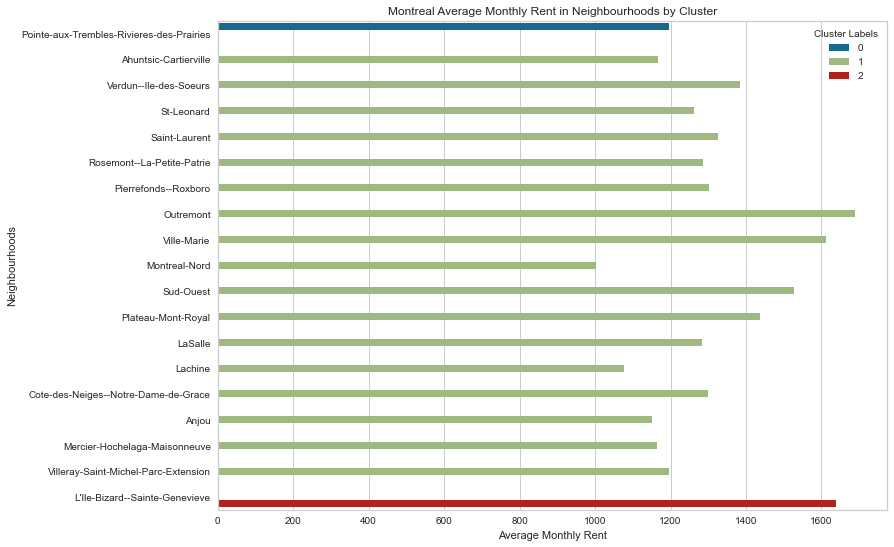

In [208]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(12, 9)) 
plt.title('Montreal Average Monthly Rent in Neighbourhoods by Cluster')
ax = sns.barplot(y="Neighbourhoods", x="Average Monthly Rent", hue ='Cluster Labels', data=Montreal)

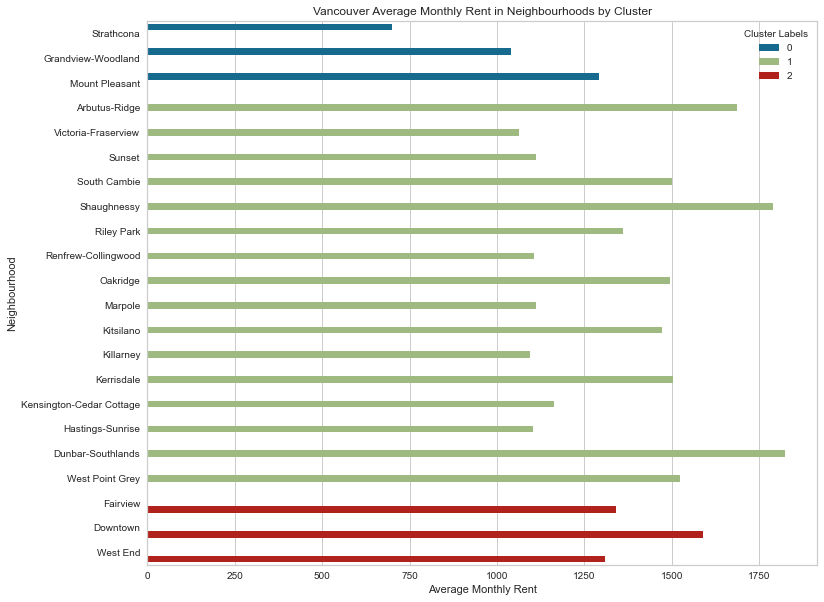

In [209]:
fig, ax1 = plt.subplots(figsize=(12, 10)) 
plt.title('Vancouver Average Monthly Rent in Neighbourhoods by Cluster')
ax1 = sns.barplot(y="Neighbourhood", x="Average Monthly Rent", hue ='Cluster Labels', data=Vancouver, orient = "h")

In [210]:
Vancouver[['Average Monthly Rent','Cluster Labels']].groupby('Cluster Labels').mean()

,Average Monthly Rent
Cluster Labels,
0,1010.333333
1,1369.500000
2,1412.666667


In [211]:
Montreal[['Average Monthly Rent','Cluster Labels']].groupby('Cluster Labels').mean()

,Average Monthly Rent
Cluster Labels,
0,1195.000000
1,1304.058824
2,1639.000000


In [67]:
Montreal['Average Monthly Rent'].mean()

1315.9473684210527

In [68]:
Vancouver['Average Monthly Rent'].mean()

1326.409090909091

In [212]:
Montreal.to_csv('Montreal.csv', sep=',')

In [213]:
Vancouver.to_csv('Vancouver.csv', sep=',')

## Import Census Data

In [96]:
df_VAN_2 = pd.read_csv('Vancouver_census.csv')
df_VAN_2 = df_VAN_2[2:]
df_VAN_2 = df_VAN_2.drop(columns = ['Unnamed: 3', 'Unnamed: 5', 'Unnamed: 7'])
df_VAN_2 = df_VAN_2.rename(columns = {'Vancouver [Census metropolitan area], British Columbia':'Total','Unnamed: 4': 'Male', 'Unnamed: 6':'Female'})
df_VAN_2

,Unnamed: 0,Unnamed: 1,Total,Male,Female
2,Population and dwellings,Population; 2016,2463431,NaN,NaN
3,Population and dwellings,Population; 2011,2313328,NaN,NaN
4,Population and dwellings,Population percentage change; 2011 to 2016,6.5,NaN,NaN
5,Population and dwellings,Total private dwellings,1027613,NaN,NaN
6,Population and dwellings,Private dwellings occupied by usual residents,960894,NaN,NaN
7,Population and dwellings,Population density per square kilometre,854.6,NaN,NaN
8,Population and dwellings,Land area in square kilometres,2882.68,NaN,NaN
9,Age characteristics,Total - Age groups and average age of the popu...,2463430,1202175,1261255
10,Age characteristics,0 to 14 years,362110,186780,175335
11,Age characteristics,0 to 4 years,116270,60045,56225


In [97]:
df_VAN_2['Total'] = df_VAN_2['Total'].astype(float)
df_VAN_2['Female'] = df_VAN_2['Female'].astype(float)
df_VAN_2['Male'] = df_VAN_2['Male'].astype(float)

In [98]:
df_VAN_2.dtypes

Unnamed: 0     object
Unnamed: 1     object
Total         float64
Male          float64
Female        float64
dtype: object

In [99]:
Van_pop = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Population and dwellings']
Van_pop = Van_pop.drop(columns = ['Unnamed: 0'])
Van_pop

,Unnamed: 1,Total,Male,Female
2,Population; 2016,2463431.00,NaN,NaN
3,Population; 2011,2313328.00,NaN,NaN
4,Population percentage change; 2011 to 2016,6.50,NaN,NaN
5,Total private dwellings,1027613.00,NaN,NaN
6,Private dwellings occupied by usual residents,960894.00,NaN,NaN
7,Population density per square kilometre,854.60,NaN,NaN
8,Land area in square kilometres,2882.68,NaN,NaN


In [100]:
Van_age = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Age characteristics']
Van_age = Van_age.drop(columns = ['Unnamed: 0'])
Van_age = Van_age.reset_index(drop=True)
Van_age_dist = Van_age [1:26]
Van_age_dist = Van_age_dist.drop([1,5,16,21])
Van_age_dist = Van_age_dist.rename(columns = {'Unnamed: 1': 'Age Group'})
Van_age_dist

,Age Group,Total,Male,Female
2,0 to 4 years,116270.0,60045.0,56225.0
3,5 to 9 years,122735.0,63390.0,59345.0
4,10 to 14 years,123110.0,63340.0,59765.0
6,15 to 19 years,142285.0,73185.0,69100.0
7,20 to 24 years,167270.0,85385.0,81885.0
8,25 to 29 years,179940.0,89305.0,90640.0
9,30 to 34 years,182625.0,89925.0,92700.0
10,35 to 39 years,167955.0,81090.0,86860.0
11,40 to 44 years,168375.0,79440.0,88930.0
12,45 to 49 years,184285.0,87850.0,96440.0


In [101]:
Van_houses = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Household and dwelling characteristics']
Van_houses=Van_houses.drop(columns = ['Unnamed: 0'])
Van_houses=Van_houses[1:]
Van_houses

,Unnamed: 1,Total,Male,Female
43,Single-detached house,282355.0,NaN,NaN
44,Apartment in a building that has five or mor...,160060.0,NaN,NaN
45,Other attached dwelling,513900.0,NaN,NaN
46,Semi-detached house,20530.0,NaN,NaN
47,Row house,93415.0,NaN,NaN
48,Apartment or flat in a duplex,156445.0,NaN,NaN
49,Apartment in a building that has fewer tha...,242205.0,NaN,NaN
50,Other single-attached house,1305.0,NaN,NaN
51,Movable dwelling,4580.0,NaN,NaN
52,Total - Private households by household size -...,960895.0,NaN,NaN


In [102]:
Van_marital = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Marital status']
Van_marital = Van_marital.drop(columns = ['Unnamed: 0'])
Van_marital = Van_marital[1:]
Van_marital

,Unnamed: 1,Total,Male,Female
61,Married or living common law,1193125.0,594185.0,598940.0
62,Married,1033885.0,513730.0,520155.0
63,Living common law,159240.0,80455.0,78785.0
64,Not married and not living common law,908195.0,421215.0,486980.0
65,Never married,629040.0,334130.0,294905.0
66,Separated,50130.0,20265.0,29860.0
67,Divorced,128040.0,47275.0,80770.0
68,Widowed,100985.0,19540.0,81445.0


In [103]:
Van_FL = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Mother tongue']
Van_FL

,Unnamed: 0,Unnamed: 1,Total,Male,Female
113,Mother tongue,Total - Mother tongue for the total population...,2440140.0,1191670.0,1248470.0
114,Mother tongue,Single responses,2361890.0,1153910.0,1207975.0
115,Mother tongue,Official languages,1341635.0,678675.0,662965.0
116,Mother tongue,English,1316635.0,666170.0,650465.0
117,Mother tongue,French,25000.0,12505.0,12500.0
118,Mother tongue,Non-official languages,1020255.0,475240.0,545010.0
119,Mother tongue,Aboriginal languages,855.0,390.0,470.0
120,Mother tongue,Algonquian languages,315.0,135.0,180.0
121,Mother tongue,Blackfoot,20.0,5.0,15.0
122,Mother tongue,Cree-Montagnais languages,225.0,105.0,120.0


In [104]:
Van_immigrants = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Immigrants by selected place of birth']
Van_immigrants = Van_immigrants[1:]
Van_immigrants = Van_immigrants.drop(columns = ['Unnamed: 0', 'Male', 'Female'])
Van_immigrants = Van_immigrants.reset_index()
Van_immigrants = Van_immigrants.rename(columns = {'Unnamed: 1':'Country'})
Van_immigrants = Van_immigrants.drop([0,11,12,29,30, 39,40,57,58])
Van_immigrants = Van_immigrants.set_index('Country')
Van_immigrants = Van_immigrants.drop(columns = 'index')
Van_immigrants  = Van_immigrants.sort_values(by = 'Total', ascending = False)
VAN_TOP = Van_immigrants.head(15)
VAN_TOP

,Total
Country,
China,188965.0
India,125640.0
Philippines,96685.0
Hong Kong,71720.0
United Kingdom,56530.0
Taiwan,37425.0
Korea; South,36860.0
Iran,35250.0
United States,26445.0


In [132]:
Van_inc = df_VAN_2.loc[df_VAN_2['Unnamed: 0'] == 'Income of households in 2015']
Van_inc = Van_inc.reset_index()
Van_inc = Van_inc[19:39]
Van_inc = Van_inc.reset_index()
Van_inc = Van_inc.drop(columns = ['level_0', 'index', 'Unnamed: 0', 'Male', 'Female'])
Van_inc['Unnamed: 1'] = Van_inc['Unnamed: 1'].astype(str)
Van_inc = Van_inc.rename(columns = {'Unnamed: 1':'Household Income'})
Van_inc = Van_inc.drop([15])
Van_inc = Van_inc.set_index('Household Income')
Van_inc

,Total
Household Income,
Under $5000,28325.0
$5000 - $9999,15380.0
$10000 - $14999,28770.0
$15000 - $19999,38310.0
$20000 - $24999,36160.0
$25000 - $29999,35660.0
$30000 - $34999,36315.0
$35000 - $39999,36530.0
$40000 - $44999,36630.0


## Montreal Census

In [106]:
df_MON_2 = pd.read_csv('Montreal_census.csv')
df_MON_2 = df_MON_2[2:]
df_MON_2 = df_MON_2.drop(columns = ['Unnamed: 3', 'Unnamed: 5', 'Unnamed: 7'])
df_MON_2 = df_MON_2.rename(columns = {'Montréal [Census metropolitan area], Quebec':'Total','Unnamed: 4': 'Male', 'Unnamed: 6':'Female'})
df_MON_2

,Unnamed: 0,Unnamed: 1,Total,Male,Female
2,Population and dwellings,Population; 2016,4098927,NaN,NaN
3,Population and dwellings,Population; 2011,3934078,NaN,NaN
4,Population and dwellings,Population percentage change; 2011 to 2016,4.2,NaN,NaN
5,Population and dwellings,Total private dwellings,1823281,NaN,NaN
6,Population and dwellings,Private dwellings occupied by usual residents,1727310,NaN,NaN
7,Population and dwellings,Population density per square kilometre,890.2,NaN,NaN
8,Population and dwellings,Land area in square kilometres,4604.26,NaN,NaN
9,Age characteristics,Total - Age groups and average age of the popu...,4098925,2000935,2097990
10,Age characteristics,0 to 14 years,691345,353270,338075
11,Age characteristics,0 to 4 years,231320,118405,112920


In [107]:
df_MON_2['Total'] = df_MON_2['Total'].astype(float)
df_MON_2['Female'] = df_MON_2['Female'].astype(float)
df_MON_2['Male'] = df_MON_2['Male'].astype(float)

In [108]:
Mon_FL = df_MON_2.loc[df_MON_2['Unnamed: 0'] == 'Mother tongue']
Mon_FL

,Unnamed: 0,Unnamed: 1,Total,Male,Female
113,Mother tongue,Total - Mother tongue for the total population...,4053355.0,1982260.0,2071100.0
114,Mother tongue,Single responses,3907510.0,1909450.0,1998060.0
115,Mother tongue,Official languages,2996905.0,1467115.0,1529795.0
116,Mother tongue,English,444955.0,222890.0,222065.0
117,Mother tongue,French,2551955.0,1244225.0,1307730.0
118,Mother tongue,Non-official languages,910605.0,442335.0,468270.0
119,Mother tongue,Aboriginal languages,755.0,275.0,480.0
120,Mother tongue,Algonquian languages,370.0,145.0,225.0
121,Mother tongue,Blackfoot,0.0,5.0,0.0
122,Mother tongue,Cree-Montagnais languages,320.0,120.0,200.0


In [109]:
Mon_pop = df_MON_2.loc[df_MON_2['Unnamed: 0'] == 'Population and dwellings']
Mon_pop

,Unnamed: 0,Unnamed: 1,Total,Male,Female
2,Population and dwellings,Population; 2016,4098927.00,NaN,NaN
3,Population and dwellings,Population; 2011,3934078.00,NaN,NaN
4,Population and dwellings,Population percentage change; 2011 to 2016,4.20,NaN,NaN
5,Population and dwellings,Total private dwellings,1823281.00,NaN,NaN
6,Population and dwellings,Private dwellings occupied by usual residents,1727310.00,NaN,NaN
7,Population and dwellings,Population density per square kilometre,890.20,NaN,NaN
8,Population and dwellings,Land area in square kilometres,4604.26,NaN,NaN


In [129]:
Mon_inc = df_MON_2.loc[df_MON_2['Unnamed: 0'] == 'Income of households in 2015']
Mon_inc = Mon_inc.reset_index()
Mon_inc = Mon_inc[19:39]
Mon_inc = Mon_inc.reset_index()
Mon_inc = Mon_inc.drop(columns = ['level_0', 'index', 'Unnamed: 0', 'Male', 'Female'])
Mon_inc['Unnamed: 1'] = Mon_inc['Unnamed: 1'].astype(str)
Mon_inc = Mon_inc.rename(columns = {'Unnamed: 1':'Household Income'})
Mon_inc = Mon_inc.drop([15])
Mon_inc = Mon_inc.set_index('Household Income')
Mon_inc

,Total
Household Income,
Under $5000,31115.0
$5000 - $9999,29850.0
$10000 - $14999,56095.0
$15000 - $19999,82840.0
$20000 - $24999,83555.0
$25000 - $29999,73240.0
$30000 - $34999,81155.0
$35000 - $39999,84995.0
$40000 - $44999,84255.0


In [111]:
Mon_age = df_MON_2.loc[df_MON_2['Unnamed: 0'] == 'Age characteristics']
Mon_age = Mon_age.drop(columns = ['Unnamed: 0'])
Mon_age_dist = Mon_age [1:26]
Mon_age_dist = Mon_age_dist.drop([10,14,25,30])
Mon_age_dist = Mon_age_dist.rename(columns = {'Unnamed: 1': 'Age Group'})
Mon_age_dist


,Age Group,Total,Male,Female
11,0 to 4 years,231320.0,118405.0,112920.0
12,5 to 9 years,242610.0,124075.0,118535.0
13,10 to 14 years,217415.0,110795.0,106620.0
15,15 to 19 years,225345.0,114530.0,110815.0
16,20 to 24 years,271635.0,136530.0,135105.0
17,25 to 29 years,270735.0,134135.0,136600.0
18,30 to 34 years,279175.0,136275.0,142905.0
19,35 to 39 years,295330.0,145080.0,150255.0
20,40 to 44 years,276490.0,137505.0,138985.0
21,45 to 49 years,277560.0,138805.0,138755.0


In [112]:
Mon_immigrants = df_MON_2.loc[df_MON_2['Unnamed: 0'] == 'Immigrants by selected place of birth']
Mon_immigrants = Mon_immigrants.drop(columns = ['Unnamed: 0', 'Male', 'Female'])
Mon_immigrants = Mon_immigrants[1:]
Mon_immigrants = Mon_immigrants.reset_index()
Mon_immigrants = Mon_immigrants.rename(columns = {'Unnamed: 1':'Country'})
Mon_immigrants = Mon_immigrants.drop([0,11,12,29,30, 39,40,57,58])
Mon_immigrants = Mon_immigrants.set_index('Country')
Mon_immigrants = Mon_immigrants.drop(columns = 'index')
Mon_immigrants = Mon_immigrants.sort_values(by = 'Total', ascending = False)
MON_TOP = Mon_immigrants.head(15)
MON_TOP

,Total
Country,
Haiti,75740.0
France,56805.0
Morocco,54495.0
Algeria,54275.0
Italy,48935.0
China,43350.0
Lebanon,35765.0
Romania,26145.0
Viet Nam,23465.0


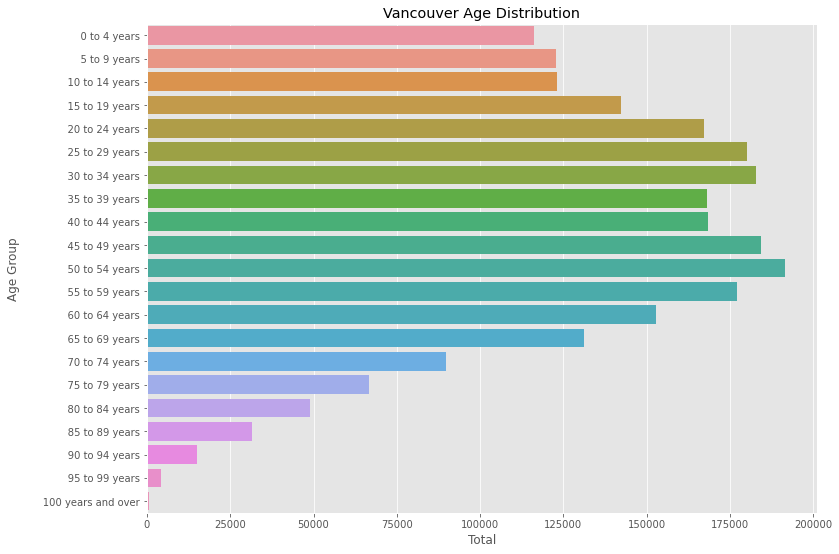

In [113]:
import matplotlib
%matplotlib inline
import matplotlib as mpl
from matplotlib import pyplot as plt

mpl.style.use('ggplot')

import seaborn as sns
fig, ax = plt.subplots(figsize=(12, 9)) 
plt.title('Vancouver Age Distribution')
ax = sns.barplot(y="Age Group", x='Total', data=Van_age_dist)

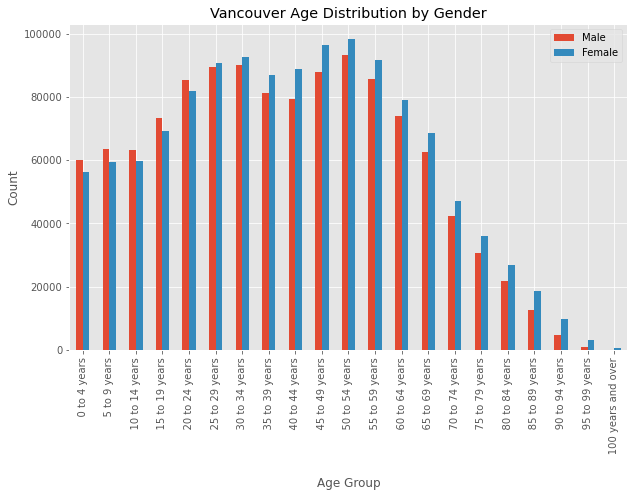

In [114]:
Van_gender = Van_age_dist.drop(columns = ['Total'])
Van_gender = Van_gender.set_index('Age Group')

Van_gender.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Age Group') # add to x-label to the plot
plt.ylabel('Count') # add y-label to the plot
plt.title('Vancouver Age Distribution by Gender') # add title to the plot

plt.show()

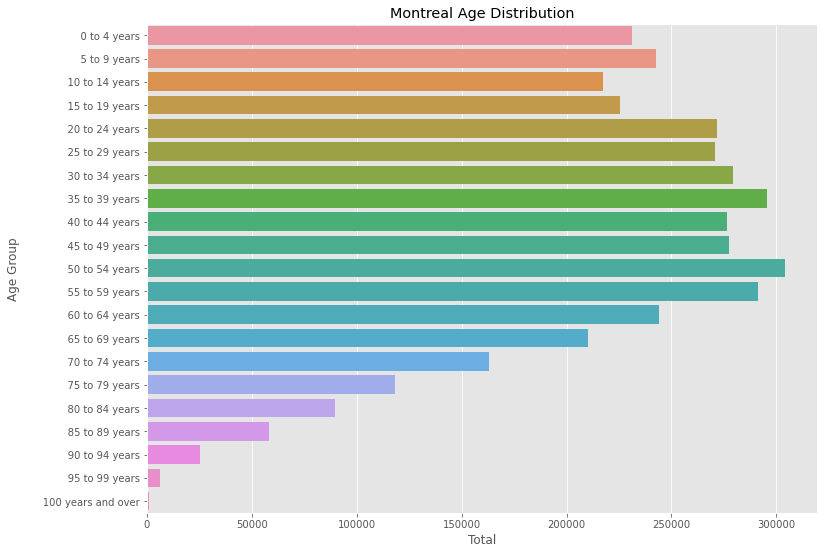

In [115]:
fig, ax = plt.subplots(figsize=(12, 9)) 
plt.title('Montreal Age Distribution')
ax = sns.barplot(y="Age Group", x='Total', data=Mon_age_dist)

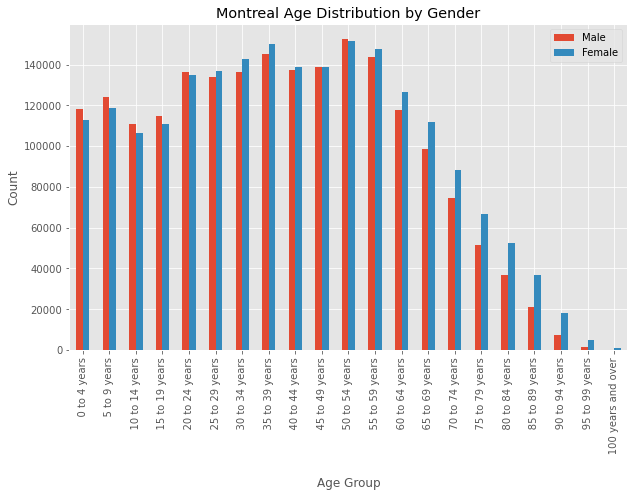

In [116]:
Mon_gender = Mon_age_dist.drop(columns = ['Total'])
Mon_gender = Mon_gender.set_index('Age Group')

Mon_gender.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Age Group') # add to x-label to the plot
plt.ylabel('Count') # add y-label to the plot
plt.title('Montreal Age Distribution by Gender') # add title to the plot

plt.show()

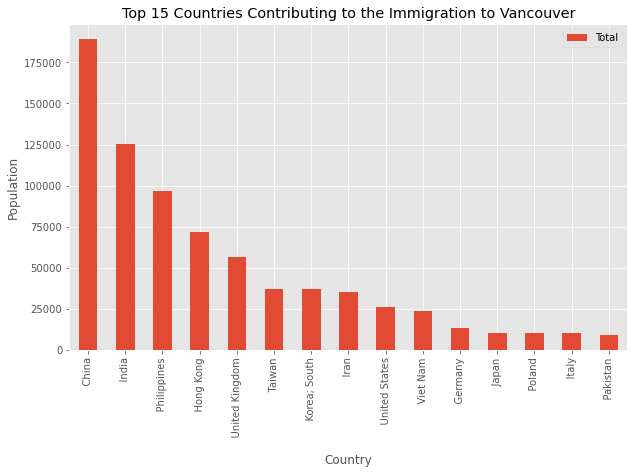

In [117]:
VAN_TOP.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Country') # add to x-label to the plot
plt.ylabel('Population') # add y-label to the plot
plt.title('Top 15 Countries Contributing to the Immigration to Vancouver') # add title to the plot

plt.show()

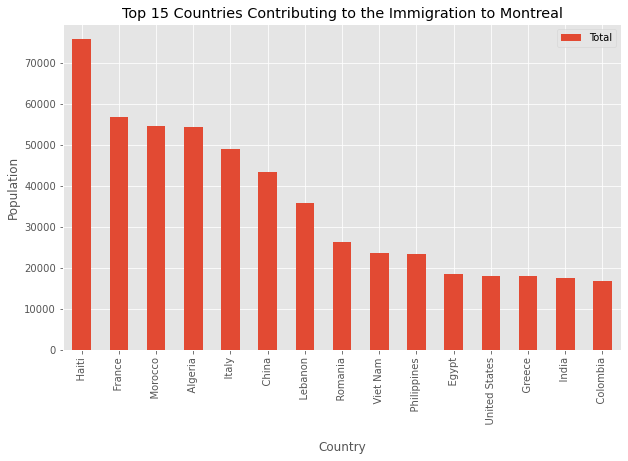

In [118]:
MON_TOP.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Country') # add to x-label to the plot
plt.ylabel('Population') # add y-label to the plot
plt.title('Top 15 Countries Contributing to the Immigration to Montreal') # add title to the plot

plt.show()

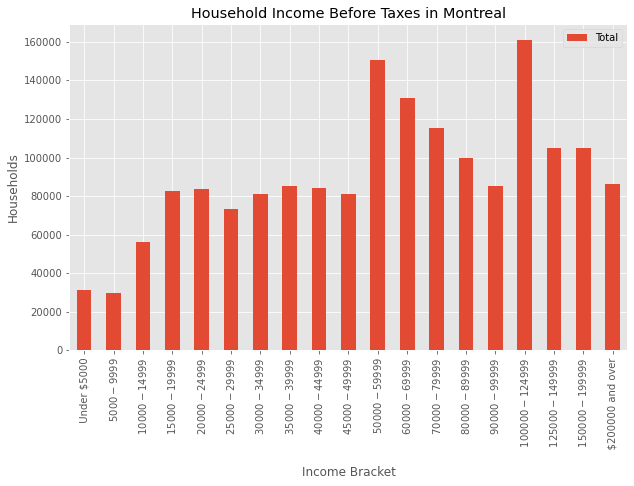

In [131]:
Mon_inc
Mon_inc.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Income Bracket') # add to x-label to the plot
plt.ylabel('Households') # add y-label to the plot
plt.title('Household Income Before Taxes in Montreal') # add title to the plot

plt.show()

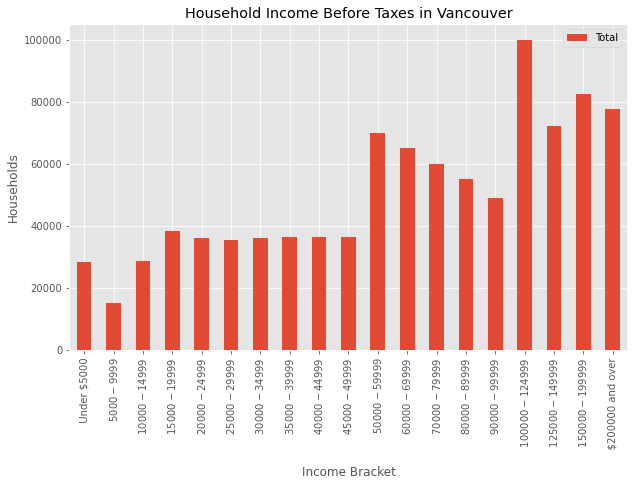

In [133]:

Van_inc.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Income Bracket') # add to x-label to the plot
plt.ylabel('Households') # add y-label to the plot
plt.title('Household Income Before Taxes in Vancouver') # add title to the plot

plt.show()

In [127]:
Van_inc.sort_values(by= 'Total')

,Total
Household Income,
$5000 - $9999,15380.0
Under $5000,28325.0
$10000 - $14999,28770.0
$25000 - $29999,35660.0
$20000 - $24999,36160.0
$30000 - $34999,36315.0
$45000 - $49999,36515.0
$35000 - $39999,36530.0
$40000 - $44999,36630.0


In [128]:
Mon_inc.sort_values(by= 'Total')

,Total
Household Income,
$5000 - $9999,29850.0
Under $5000,31115.0
$10000 - $14999,56095.0
$25000 - $29999,73240.0
$45000 - $49999,80890.0
$30000 - $34999,81155.0
$15000 - $19999,82840.0
$20000 - $24999,83555.0
$40000 - $44999,84255.0


In [187]:
from sklearn import datasets
from sklearn.cluster import KMeans

# set number of clusters
kclusters =3
Montreal_grouped_clustering = Montreal_grouped.drop('Neighbourhood', 1)

# run k-means clustering
km = KMeans(n_clusters=kclusters, random_state=0).fit(Van_grouped_clustering)

# Fit the KMeans model
#
km.fit_predict(Montreal_grouped_clustering)
#
# Calculate Silhoutte Score
#
score = silhouette_score(Montreal_grouped_clustering, km.labels_, metric='euclidean')

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.487


In [220]:
from sklearn import datasets
from sklearn.cluster import KMeans

# set number of clusters
kclusters =3
Montreal_grouped_clustering = Montreal_grouped.drop('Neighbourhood', 1)

# run k-means clustering
km = KMeans(n_clusters=kclusters, random_state=43).fit(Van_grouped_clustering)

# Fit the KMeans model
#
km.fit_predict(Montreal_grouped_clustering)
#
# Calculate Silhoutte Score
#
score = silhouette_score(Montreal_grouped_clustering, km.labels_, metric='euclidean')

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.487


In [221]:
from sklearn import datasets
from sklearn.cluster import KMeans

# set number of clusters
kclusters =3
Montreal_grouped_clustering = Montreal_grouped.drop('Neighbourhood', 1)

# run k-means clustering
km = KMeans(n_clusters=kclusters, random_state=43).fit(Montreal_grouped_clustering)

# Fit the KMeans model
#
km.fit_predict(Montreal_grouped_clustering)
#
# Calculate Silhoutte Score
#
score = silhouette_score(Montreal_grouped_clustering, km.labels_, metric='euclidean')

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.487
